<a href="https://colab.research.google.com/github/Lucs1590/vgg_bpca/blob/master/notebooks/vgg_net_cifar100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VGG NET (CIFAR-100)
Here we are using a VGG net with 19 layers with the dataset cifar 100.

We are trying to reproduce the results of the paper [1] and after we will try to change some layers and see how it affects the results.

[1] https://arxiv.org/pdf/1409.1556.pdf


# Imports

In [1]:
%pip install lime
# %pip install tensorflow==2.8.3
# %pip install tensorflow-gpu==2.8.3
import os
import time
import json
import random
import math

from uuid import uuid4
from datetime import datetime

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from PIL import Image

# from google.colab import drive

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf

import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

from keras import backend
from keras.applications import imagenet_utils
from keras.callbacks import (EarlyStopping, ModelCheckpoint, ReduceLROnPlateau,
                             TensorBoard, Callback, LearningRateScheduler, CSVLogger)
from keras.datasets import cifar100
from keras.engine import training
from keras.layers import VersionAwareLayers, Layer
# from keras.layers.pooling.base_pooling2d import Pooling2D
from keras.models import Sequential, model_from_json, load_model
from keras.optimizers import Adam, SGD
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import data_utils, layer_utils, to_categorical, load_img, img_to_array
from sklearn.model_selection import train_test_split


Note: you may need to restart the kernel to use updated packages.


/Users/brito/opt/anaconda3/envs/mestrado/lib/python3.8/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.1.0)/charset_normalizer (3.1.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "
/Users/brito/opt/anaconda3/envs/mestrado/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print(tf.__version__)

2.11.0


In [3]:
%load_ext tensorboard
# drive.mount('/content/gdrive')


In [4]:
!nvidia-smi


zsh:1: command not found: nvidia-smi


# Load the dataset

In [5]:
np.random.seed(77)
tf.random.set_seed(77)


In [6]:
(X_train, y_train), (X_test, y_test) = cifar100.load_data()
X_train = X_train / 255.0
X_test = X_test / 255.0


We will split the test set in two parts, where one of this will be used to validation. After that we will declare the classes and plot some random images.

In [7]:
X_test, X_valid, y_test, y_valid = train_test_split(
    X_test,
    y_test,
    test_size=0.7
)


In [8]:
classes_dict = {
    "0": ['apple'],
    "1": ['aquarium_fish'],
    "2": ['baby'],
    "3": ['bear'],
    "4": ['beaver'],
    "5": ['bed'],
    "6": ['bee'],
    "7": ['beetle'],
    "8": ['bicycle'],
    "9": ['bottle'],
    "10": ['bowl'],
    "11": ['boy'],
    "12": ['bridge'],
    "13": ['bus'],
    "14": ['butterfly'],
    "15": ['camel'],
    "16": ['can'],
    "17": ['castle'],
    "18": ['caterpillar'],
    "19": ['cattle'],
    "20": ['chair'],
    "21": ['chimpanzee'],
    "22": ['clock'],
    "23": ['cloud'],
    "24": ['cockroach'],
    "25": ['couch'],
    "26": ['crab'],
    "27": ['crocodile'],
    "28": ['cup'],
    "29": ['dinosaur'],
    "30": ['dolphin'],
    "31": ['elephant'],
    "32": ['flatfish'],
    "33": ['forest'],
    "34": ['fox'],
    "35": ['girl'],
    "36": ['hamster'],
    "37": ['house'],
    "38": ['kangaroo'],
    "39": ['computer_keyboard'],
    "40": ['lamp'],
    "41": ['lawn_mower'],
    "42": ['leopard'],
    "43": ['lion'],
    "44": ['lizard'],
    "45": ['lobster'],
    "46": ['man'],
    "47": ['maple_tree'],
    "48": ['motorcycle'],
    "49": ['mountain'],
    "50": ['mouse'],
    "51": ['mushroom'],
    "52": ['oak_tree'],
    "53": ['orange'],
    "54": ['orchid'],
    "55": ['otter'],
    "56": ['palm_tree'],
    "57": ['pear'],
    "58": ['pickup_truck'],
    "59": ['pine_tree'],
    "60": ['plain'],
    "61": ['plate'],
    "62": ['poppy'],
    "63": ['porcupine'],
    "64": ['possum'],
    "65": ['rabbit'],
    "66": ['raccoon'],
    "67": ['ray'],
    "68": ['road'],
    "69": ['rocket'],
    "70": ['rose'],
    "71": ['sea'],
    "72": ['seal'],
    "73": ['shark'],
    "74": ['shrew'],
    "75": ['skunk'],
    "76": ['skyscraper'],
    "77": ['snail'],
    "78": ['snake'],
    "79": ['spider'],
    "80": ['squirrel'],
    "81": ['streetcar'],
    "82": ['sunflower'],
    "83": ['sweet_pepper'],
    "84": ['table'],
    "85": ['tank'],
    "86": ['telephone'],
    "87": ['television'],
    "88": ['tiger'],
    "89": ['tractor'],
    "90": ['train'],
    "91": ['trout'],
    "92": ['tulip'],
    "93": ['turtle'],
    "94": ['wardrobe'],
    "95": ['whale'],
    "96": ['willow_tree'],
    "97": ['wolf'],
    "98": ['woman'],
    "99": ['worm']
}


In [9]:
labels = [classes_dict[str(i)][0] for i in range(len(classes_dict))]
# ['apple', 'aquarium_fish', 'baby', 'bear', 'beaver', 'bed', 'bee', 'beetle', 'bicycle', 'bottle', 'bowl', 'boy', 'bridge', 'bus', 'butterfly',
#  'camel', 'can', 'castle', 'caterpillar', 'cattle', 'chair', 'chimpanzee', 'clock', 'cloud', 'cockroach', 'couch', 'crab', 'crocodile', 'cup',
#  'dinosaur', 'dolphin', 'elephant', 'flatfish', 'forest', 'fox', 'girl', 'hamster', 'house', 'kangaroo', 'computer_keyboard',
#  'lamp', 'lawn_mower', 'leopard', 'lion', 'lizard', 'lobster', 'man', 'maple_tree', 'motorcycle', 'mountain', 'mouse', 'mushroom',
#  'oak_tree', 'orange', 'orchid', 'otter', 'palm_tree', 'pear', 'pickup_truck', 'pine_tree', 'plain', 'plate', 'poppy', 'porcupine', 'possum',
#  'rabbit', 'raccoon', 'ray', 'road', 'rocket', 'rose', 'sea', 'seal', 'shark', 'shrew', 'skunk', 'skyscraper', 'snail', 'snake', 'spider',
#  'squirrel', 'streetcar', 'sunflower', 'sweet_pepper', 'table', 'tank', 'telephone', 'television', 'tiger', 'tractor', 'train', 'trout',
#  'tulip', 'turtle', 'wardrobe', 'whale', 'willow_tree', 'wolf', 'woman', 'worm'
# ]


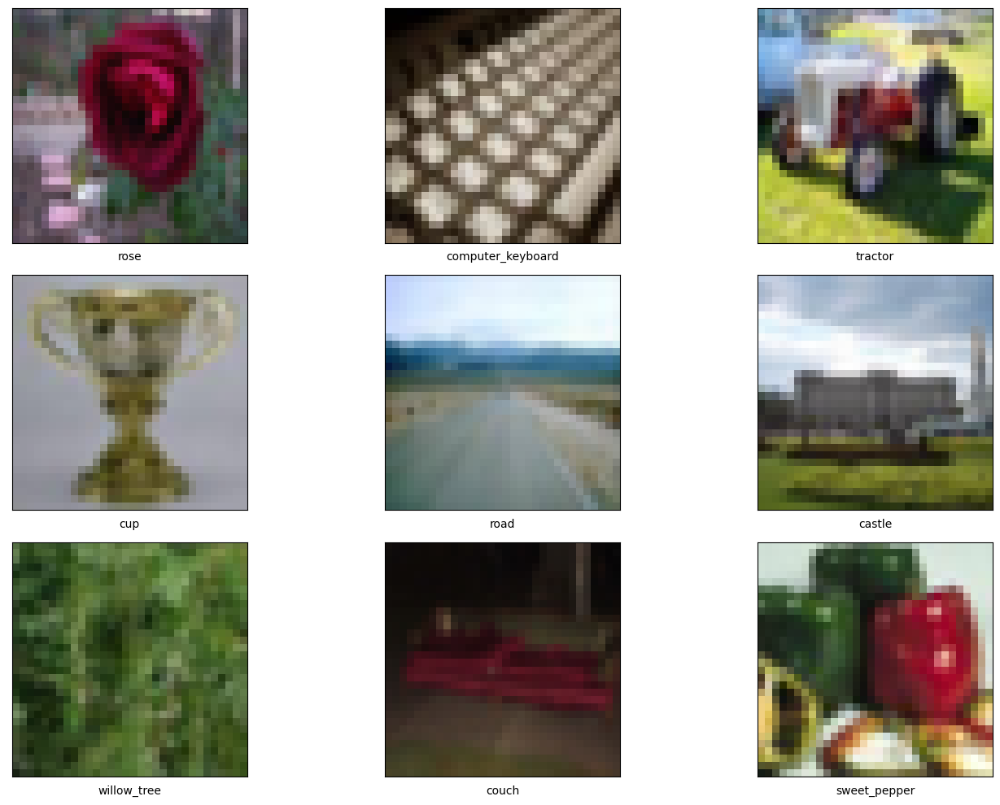

In [10]:
plt.figure(figsize=(15, 10))
random_images = []

num_rows = 3
num_cols = 3
num_images = num_rows * num_cols

for i in range(num_images):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    numb = random.randint(0, len(X_train))

    plt.imshow(X_train[numb], cmap="gray")
    plt.xlabel(labels[y_train[numb].astype(int)[0]])

    img_path = f'{uuid4()}.png'
    random_images.append(img_path)

plt.tight_layout()
plt.show()


Here the data will be converted to a scale between 0 and 1.

In [11]:
print(f'Train: {len(X_train)}')
print(f'Test: {len(X_test)}')
print(f'Validation: {len(X_valid)}')
y_train = to_categorical(y_train, len(labels))
y_test = to_categorical(y_test, len(labels))
y_valid = to_categorical(y_valid, len(labels))


Train: 50000
Test: 3000
Validation: 7000


## Data Augmentation
The last thing in this step is apply a lot of filters to the train dataset.



In [12]:
datagen = ImageDataGenerator(
    height_shift_range=0.25,
    width_shift_range=0.25,
    shear_range=0.25,
    zoom_range=0.25,
    rotation_range=45,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(X_train)


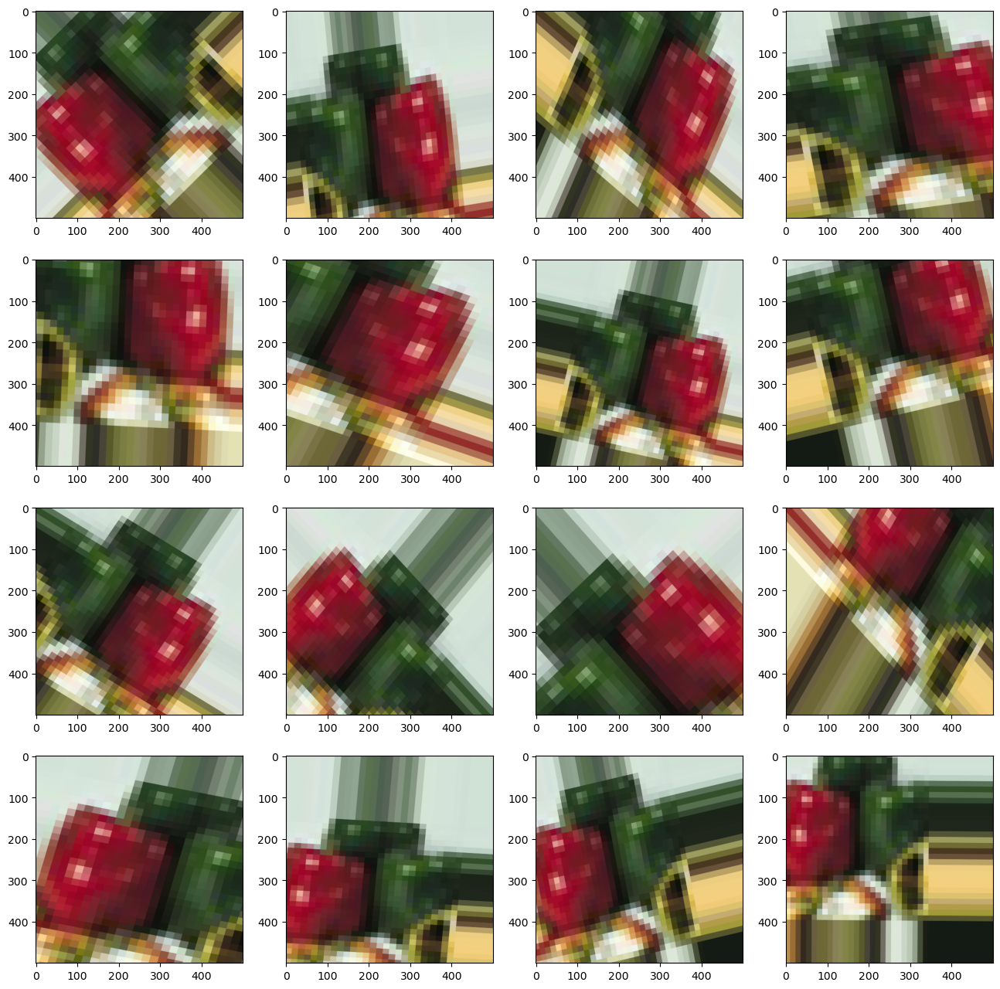

In [14]:
plt.imsave('test.png', X_train[numb])

img = load_img('test.png', target_size=(500, 500))
img_tensor = img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

pic = datagen.flow(img_tensor, batch_size=1)
plt.figure(figsize=(16, 16))

for i in range(1, 17):
    plt.subplot(4, 4, i)
    batch = pic.next()
    image_ = batch[0].astype('uint8')
    plt.imshow(image_)
plt.show()


# Auxiliary Code

## TensorBoard Settings

In [15]:
date_now = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f'/home/hinton/brito/notebooks/logs/fit/{date_now}'


In [ ]:
# from tensorboard import notebook
# notebook.display(port=6006, height=1000)
%tensorboard --logdir={log_dir}


<IPython.core.display.Javascript object>

## Learning Rate Scheduler


In [16]:
class CyclicLR(Callback):

    def __init__(self, base_lr=1e-5, max_lr=1e-3, step_size=500, log_dir=None):
        super(CyclicLR, self).__init__()

        self.base_lr = base_lr
        self.max_lr = max_lr
        self.step_size = step_size
        self.scale_fn = lambda x: 1/(2.**(x-1))
        self.clr_iterations = 0.
        self.trn_iterations = 0.
        self.clr_iterations = 0.
        self.history = {}
        self.log_dir = log_dir
        if self.log_dir:
            # create a summary writer
            self.file_writer = tf.summary.create_file_writer(self.log_dir)

    def clr(self):
        cycle = np.floor(1+self.clr_iterations/(2*self.step_size))
        x = np.abs(self.clr_iterations/self.step_size - 2*cycle + 1)
        lr = self.base_lr + (self.max_lr-self.base_lr) * np.maximum(0, (1-x))*self.scale_fn(cycle)
        # print(f'Current LR: {lr}')
        return lr

    def on_train_begin(self, logs={}):
        logs = logs or {}

        if self.clr_iterations == 0:
            backend.set_value(self.model.optimizer.lr, self.base_lr)
        else:
            backend.set_value(self.model.optimizer.lr, self.clr())

    def on_batch_end(self, epoch, logs=None):
        logs = logs or {}
        self.trn_iterations += 1
        self.clr_iterations += 1

        self.history.setdefault('lr', []).append(
            backend.get_value(self.model.optimizer.lr)
        )
        self.history.setdefault('iterations', []).append(self.trn_iterations)

        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)

        backend.set_value(self.model.optimizer.lr, self.clr())

    def on_epoch_end(self, epoch, logs=None):
        lr = backend.get_value(self.model.optimizer.lr)
        with self.file_writer.as_default():
            tf.summary.scalar('learning rate', lr, step=int(epoch))


clr = CyclicLR(log_dir=log_dir)


In [17]:
def lr_scheduler(epoch, lr, nb_epoch=0):
    drop_rate = .99
    epochs_drop = 8

    if epoch % epochs_drop == 0:
        return lr * math.pow(drop_rate, math.floor(epoch/epochs_drop))

    return lr


## BPCA Pooling Layer

In [8]:

class BPCAPooling(tf.keras.layers.Layer):
    def __init__(self, pool_size=2, stride=2, n_components=1, expected_shape=None, **kwargs):
        super(BPCAPooling, self).__init__(**kwargs)
        self.pool_size = pool_size
        self.stride = stride
        self.n_components = n_components
        self.expected_shape = expected_shape

        self.patch_size = [1, self.pool_size, self.pool_size, 1]
        self.strides = [1, self.stride, self.stride, 1]

    def build(self, input_shape):
        super(BPCAPooling, self).build(input_shape)

    @tf.function
    def bpca_pooling(self,feature_map):
        # Compute the region of interest
        h, w, c = self.expected_shape  # block_height, block_width, block_channels
        d = c // (self.pool_size * self.pool_size)  # block_depth

        # Create blocks (patches)
        data = tf.reshape(feature_map,[1, h, w, c])
        patches = tf.image.extract_patches(
            images=data,
            sizes=self.patch_size,
            strides=self.strides,
            rates=[1, 1, 1, 1],
            padding='VALID'
        )
        patches = tf.reshape(
            patches,
            [h*w*d, self.pool_size * self.pool_size]
        )

        # Normalize the data by subtracting the mean and dividing by the standard deviation
        mean = tf.reduce_mean(patches, axis=0)
        std = tf.math.reduce_std(patches, axis=0)
        patches = (patches - mean) / std
        patches = tf.where(tf.math.is_nan(patches), 0.0, patches)

        # Perform the Singular Value Decomposition (SVD) on the data
        _, _, v = tf.linalg.svd(patches)

        # Extract the first n principal components from the matrix v
        pca_components = v[:, :self.n_components]

        # Perform the PCA transformation on the data
        transformed_patches = tf.matmul(patches, pca_components)
        return tf.reshape(transformed_patches, [h // self.pool_size, w // self.pool_size, c])

    def call(self, inputs):
        pooled = tf.vectorized_map(self.bpca_pooling, inputs)
        return pooled


In [20]:
class GlobalBPCAPooling2D(tf.keras.layers.Layer):
    def __init__(self, n_components=1, expected_output_shape=(-1, 512), **kwargs):
        super(GlobalBPCAPooling2D, self).__init__(**kwargs)
        self.n_components = n_components
        self.expected_output_shape = expected_output_shape

    def build(self, input_shape):
        super(GlobalBPCAPooling2D, self).build(input_shape)

    def get_config(self):
        config = {
            'n_components': self.n_components
        }
        base_config = super(GlobalBPCAPooling2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    @tf.function
    def bpca_pooling(self, feature_map):
        # Flatten the feature map
        patches = tf.reshape(feature_map, self.expected_output_shape)

        # Normalize the data by subtracting the mean and dividing by the standard deviation
        mean = tf.reduce_mean(patches, axis=0)
        std = tf.math.reduce_std(patches, axis=0)
        patches = (patches - mean) / std
        patches = tf.where(tf.math.is_nan(patches), 0.0, patches)

        # Perform the Singular Value Decomposition (SVD) on the data
        _, _, v = tf.linalg.svd(patches)

        # Extract the first n principal components from the matrix v
        pca_components = v[:, :self.n_components]

        # Perform the PCA transformation on the data
        transformed_patches = tf.matmul(patches, pca_components)
        return transformed_patches

    def call(self, inputs):
        if len(self.expected_output_shape) == 2:
            pooled = tf.reshape(inputs, self.expected_output_shape)
        else:
            pooled = tf.vectorized_map(self.bpca_pooling, inputs)
            pooled = tf.reduce_mean(pooled, axis=0, keepdims=True)
        return pooled


# VGG Archtecture

## VGG 16
- The cons of this architecture are that it is slow to train and produces the model with very large size.
- A total of 13 convolutional layers are stacked one after the other and 3 dense layers for classification.


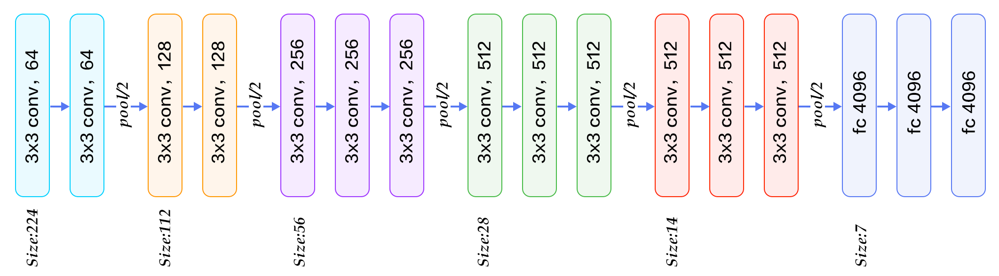

In [25]:
layers = VersionAwareLayers()
WEIGHTS_PATH = (
    "https://storage.googleapis.com/tensorflow/keras-applications/"
    "vgg16/vgg16_weights_tf_dim_ordering_tf_kernels.h5"
)
WEIGHTS_PATH_NO_TOP = (
    "https://storage.googleapis.com/tensorflow/"
    "keras-applications/vgg16/"
    "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5"
)


def VGG16(include_top=True, weights="imagenet", input_tensor=None, input_shape=None, pooling=None, classes=1000, classifier_activation="softmax"):
    if not (weights in {"imagenet", None} or tf.io.gfile.exists(weights)):
        raise ValueError(
            "The `weights` argument should be either "
            "`None` (random initialization), `imagenet` "
            "(pre-training on ImageNet), "
            "or the path to the weights file to be loaded.  Received: "
            f"weights={weights}"
        )

    if weights == "imagenet" and include_top and classes != 1000:
        raise ValueError(
            'If using `weights` as `"imagenet"` with `include_top` '
            "as true, `classes` should be 1000.  "
            f"Received `classes={classes}`"
        )

    input_shape = imagenet_utils.obtain_input_shape(
        input_shape,
        default_size=224,
        min_size=32,
        data_format=backend.image_data_format(),
        require_flatten=include_top,
        weights=weights,
    )

    if input_tensor is None:
        img_input = layers.Input(shape=input_shape)
    else:
        if not backend.is_keras_tensor(input_tensor):
            img_input = layers.Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor
    # Block 1
    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv1")(img_input)
    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same", name="block1_conv2")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block1_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block1_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block1_pool", expected_shape=(32, 32, 64))(x)

    # Block 2
    x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv1")(x)
    x = layers.Conv2D(128, (3, 3), activation="relu", padding="same", name="block2_conv2")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block2_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block2_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block2_pool", expected_shape=(16, 16, 128))(x)

    # Block 3
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv1")(x)
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv2")(x)
    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same", name="block3_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block3_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block3_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block3_pool", expected_shape=(8, 8, 256))(x)

    # Block 4
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv1")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv2")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block4_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block4_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block4_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block4_pool", expected_shape=(4, 4, 512))(x)

    # Block 5
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv1")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv2")(x)
    x = layers.Conv2D(512, (3, 3), activation="relu", padding="same", name="block5_conv3")(x)
    # x = layers.MaxPooling2D((2, 2), strides=(2, 2), name="block5_pool")(x)
    # x = layers.AveragePooling2D((2, 2), strides=(2, 2), name="block5_pool")(x)
    x = BPCAPooling(pool_size=2, stride=2, n_components=1, name="block5_pool", expected_shape=(2, 2, 512))(x)

    if include_top:
        # Classification block
        x = layers.Flatten(name="flatten")(x)
        x = layers.Dense(4096, activation="relu", name="fc1")(x)
        x = layers.Dense(4096, activation="relu", name="fc2")(x)

        imagenet_utils.validate_activation(classifier_activation, weights)
        x = layers.Dense(
            classes, activation=classifier_activation, name="predictions"
        )(x)
    else:
        if pooling == "avg":
            x = layers.GlobalAveragePooling2D()(x)
        elif pooling == "max":
            x = layers.GlobalMaxPooling2D()(x)
        else:
            x = layers.GlobalMaxPooling2D()(x)
            # x = GlobalBPCAPooling2D(n_components=1, expected_output_shape=(-1, 512))(x) # Could be this method, but the result is the same and GlobalMaxPooling2D is faster

    if input_tensor is not None:
        inputs = layer_utils.get_source_inputs(input_tensor)
    else:
        inputs = img_input

    vgg16_model = training.Model(inputs, x, name="vgg16")

    if weights == "imagenet":
        if include_top:
            weights_path = data_utils.get_file(
                "vgg16_weights_tf_dim_ordering_tf_kernels.h5",
                WEIGHTS_PATH,
                cache_subdir="models",
                file_hash="64373286793e3c8b2b4e3219cbf3544b",
            )
        else:
            weights_path = data_utils.get_file(
                "vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5",
                WEIGHTS_PATH_NO_TOP,
                cache_subdir="models",
                file_hash="6d6bbae143d832006294945121d1f1fc",
            )
        vgg16_model.load_weights(weights_path)
    elif weights is not None:
        vgg16_model.load_weights(weights)

    return vgg16_model


# Training

## Loading model from scratch

In [26]:
# VGG16
vgg16_model = VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=X_train[0].shape,
    classes=len(labels),
    pooling="bpca"
)

for idx, layer in enumerate(vgg16_model.layers):
    print(idx, layer)
    layer.trainable = False

vgg16_model.summary()


0 <keras.engine.input_layer.InputLayer object at 0x7f6cc8ac55a0>
1 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8ac4160>
2 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8ac4220>
3 <__main__.BPCAPooling object at 0x7f6c07ea2050>
4 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8901450>
5 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cedf27e50>
6 <__main__.BPCAPooling object at 0x7f6cc8903190>
7 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8ac79a0>
8 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8ac7910>
9 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6c85aebf10>
10 <__main__.BPCAPooling object at 0x7f6cc8903f10>
11 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6cc8ac6530>
12 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6c85be8df0>
13 <keras.layers.convolutional.conv2d.Conv2D object at 0x7f6c85a095a0>
14 <__main__.BPCAPooling object at 0x7f6c85baf520>
15 <keras.layers.convolutional

In [27]:
tf.keras.utils.plot_model(vgg16_model, expand_nested=True, dpi=60, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


Add classification layers.

In [28]:
model = Sequential()
model.add(vgg16_model)
# model.add(layers.Flatten(name="flatten"))
model.add(layers.Dense(4096, activation="relu", name="fc1"))
model.add(layers.Dropout(0.35))
model.add(layers.Dense(4096, activation="relu", name="fc2"))
model.add(layers.Dense(len(labels), activation='softmax', name="predictions"))

untrainable_layers = [0]
for idx, layer in enumerate(model.layers):
    print(idx, layer)
    layer.trainable = False
    if idx not in untrainable_layers:
        layer.trainable = True

model.summary()
vgg16_model = model
del model


0 <keras.engine.functional.Functional object at 0x7f6c8595cac0>
1 <keras.layers.core.dense.Dense object at 0x7f6c85941d50>
2 <keras.layers.regularization.dropout.Dropout object at 0x7f6c85942ce0>
3 <keras.layers.core.dense.Dense object at 0x7f6cc967faf0>
4 <keras.layers.core.dense.Dense object at 0x7f6cc8bd6650>
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 fc1 (Dense)                 (None, 4096)              2101248   
                                                                 
 dropout (Dropout)           (None, 4096)              0         
                                                                 
 fc2 (Dense)                 (None, 4096)              16781312  
                                                                 
 predi

## Loading model with pre-trained weights

In [9]:
# with open('/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16.json', 'r') as json_file:
#     loaded_model_json = json_file.read()
#     vgg16_model = model_from_json(loaded_model_json)

# vgg16_model.load_weights("/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16_block4.h5")
vgg16_model = load_model(
    "/Users/brito/Documents/Dev/vgg_bpca/notebooks/cifar100_vgg16_bpca_warmup.h5",
    custom_objects={
        "BPCAPooling": BPCAPooling,
    }
)

# vgg16_model.load_weights(
#     '/content/gdrive/MyDrive/Projetos/colab-tests/cifar100_vgg16_block5.h5',
#     by_name=True,
#     skip_mismatch=True
# )


In [ ]:
history = pd.read_csv('/home/hinton/brito/notebooks/food101_vgg16_avg_warmup.csv')
history.head()

Unfreezing some layers.

In [ ]:
def change_trainable_attribute(layers_to_change: list, layers: VersionAwareLayers) -> None:
    for idx, layer in enumerate(layers):
        new_value = False
        if idx in layers_to_change:
            new_value = True
            print(f'  {layer.name} will be trained')
        layer.trainable = new_value


In [ ]:
trainable_layers = list(range(15, 19))

for idx, layer in enumerate(vgg16_model.layers):
    try:
        layer.summary()
        change_trainable_attribute(trainable_layers, layer.layers)
    except AttributeError:
        layer.trainable = False

vgg16_model.summary()


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 32, 32, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 32, 32, 64)        36928     
                                                                 
 bpca_layer (BPCALayer)      (None, 16, 16, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 16, 16, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 16, 16, 128)       147584    
                                                                 
 bpca_layer_1 (BPCALayer)    (None, 8, 8, 128)         0     

## Training & Choice of parameters

In [29]:
model_name = 'cifar100_vgg16_bpca_warmup'


In [ ]:
model_checkpointer = ModelCheckpoint(f'/home/hinton/brito/notebooks/{model_name}.h5', monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='max')
# reduce_lr = LearningRateScheduler(lr_scheduler, verbose=1)
# early_stopping = EarlyStopping(monitor='val_accuracy', min_delta=0, mode='auto', verbose=1, patience=100)
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True, write_images=True)
store_history = CSVLogger(f'/home/hinton/brito/notebooks/{model_name}.csv', append=True)

optimizer = Adam(learning_rate=1e-5)
# optimizer = SGD(learning_rate=1e-5)

vgg16_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=optimizer,
    metrics=['accuracy']
)

start_time = time.perf_counter()
with tf.device('/gpu:0'):
    history = vgg16_model.fit(
        datagen.flow(X_train, y_train, batch_size=64, shuffle=True),
        validation_data=(X_valid, y_valid), epochs=700, verbose=1,
        callbacks=[
            model_checkpointer,
            tensorboard_callback,
            store_history,
            # clr,
            # early_stopping,
            # reduce_lr
        ]
    )
end_time = time.perf_counter()


Epoch 1/700


TypeError: ignored

In [ ]:
print(f'Time to train: {str("{0:.2f}".format((end_time - start_time) / 60))}')


In [ ]:
vgg16_model.save(f'{model_name}_last_epoch.h5')
model_json = vgg16_model.to_json()
with open(f'{model_name}.json', "w") as json_file:
    json_file.write(model_json)

In [ ]:
# !cp /content/{model_name}.h5 /content/gdrive/MyDrive/{model_name}.h5
# !cp /content/{model_name}_last_epoch.h5 /content/gdrive/MyDrive/{model_name}_last_epoch.h5.h5
# !cp /content/{model_name}.json /content/gdrive/MyDrive/{model_name}.json
# !cp /content/{model_name}.csv /content/gdrive/MyDrive/{model_name}.csv

# Test

In [ ]:
loss, accuracy = vgg16_model.evaluate(X_test, y_test, verbose=1)
print("Loss:", loss)
print("Accuracy: %.2f%%" % (accuracy * 100))


94/94 [==============================] - 8s 12ms/step - loss: 2.1755 - accuracy: 0.4253
Loss: 2.1755194664001465
Accuracy: 42.53%


In [ ]:
if isinstance(history, pd.DataFrame):
    plt.plot(history['loss'])
    plt.plot(history['val_loss'])
    plt.legend(['train', 'test'])
    plt.title('loss')
    plt.legend(["Loss", "Validation Loss"])
    plt.savefig("loss.png", dpi=300, format="png")
    plt.figure()
    plt.plot(history["accuracy"])
    plt.plot(history['val_accuracy'])
    plt.legend(['train', 'test'])
    plt.title('accuracy')

else:
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['train', 'test'])
    plt.title('loss')
    plt.legend(["Loss", "Validation Loss"])
    plt.savefig("loss.png", dpi=300, format="png")
    plt.figure()
    plt.plot(history.history["accuracy"])
    plt.plot(history.history['val_accuracy'])
    plt.legend(['train', 'test'])
    plt.title('accuracy')

plt.legend(["Accuracy", "Validation Accuracy"])
plt.savefig("accuracy.png", dpi=300, format="png")


NameError: ignored

94/94 [==============================] - 1s 8ms/step


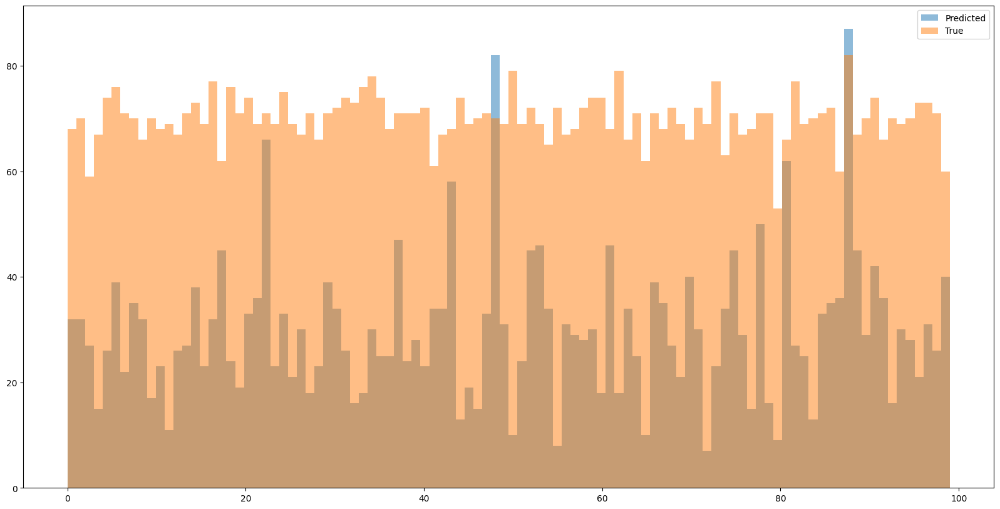

In [ ]:
# plot the probability distribution of the predictions
y_pred = vgg16_model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_valid, axis=1)

plt.figure(figsize=(20, 10))
plt.hist(
  y_pred,
  bins=len(labels),
  alpha=0.5,
  label='Predicted'
)
plt.hist(
  y_true,
  bins=len(labels),
  alpha=0.5,
  label='True'
)
plt.legend(loc='upper right')
plt.show()


## Layers output
Here we can see what the network see in each layer, that is, the output.

In [ ]:
img_index = 4

In [ ]:
def get_plotting_matrix_shape(num):
    """
    Given a number, returns the number of columns and the number of rows needed for a plotting matrix.
    """
    sqrt = int(num ** 0.5)
    if sqrt ** 2 == num:
        return sqrt, sqrt
    else:
        for i in range(sqrt, 0, -1):
            if num % i == 0:
                return num // i, i


In [ ]:
def visualize_conv_layer(model, train_base, layer_name, numb):
  layer_output=model.get_layer(layer_name).output
  h, w, l = train_base.shape[1:]

  intermediate_model=tf.keras.models.Model(
      inputs=model.input,
      outputs=layer_output
  )
  intermediate_prediction=intermediate_model.predict(
      train_base[numb].reshape(1,h,w,l)
  )

  row_size, col_size = get_plotting_matrix_shape(np.shape(intermediate_prediction)[-1])

  img_index=0
  print(np.shape(intermediate_prediction))

  fig,ax=plt.subplots(row_size,col_size,figsize=(10,8))
  for row in range(0,row_size):
    for col in range(0,col_size):
      ax[row][col].tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False)
      ax[row][col].imshow(intermediate_prediction[0, :, :, img_index], cmap='gray')
      img_index+=1


Text(0.5, 1.0, 'Class: bear')

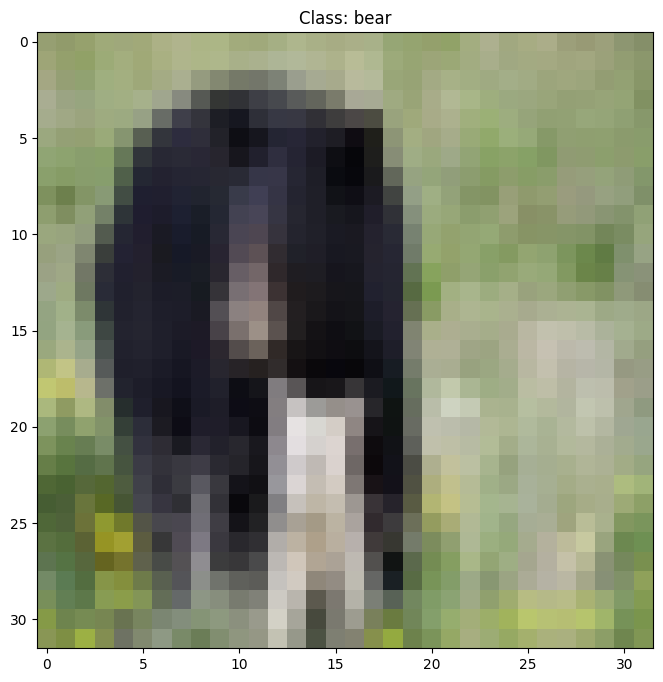

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(X_test[img_index])
ax.set_title(f'Class: {classes_dict[str(np.argmax(y_test[img_index]))][0]}')

1/1 [==============================] - 0s 49ms/step
(1, 16, 16, 64)


AttributeError: ignored

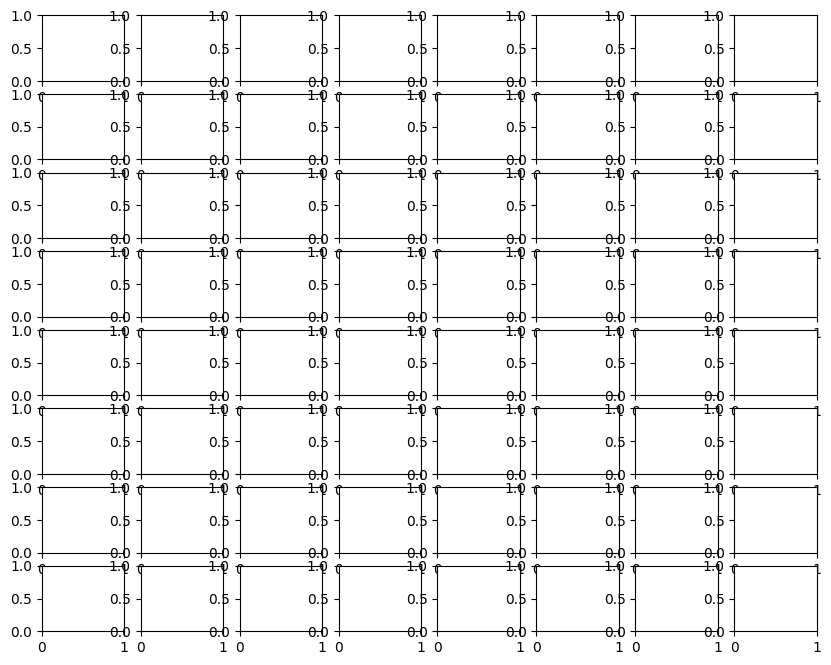

In [ ]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    X_train,
    'block1_pool',
    img_index
)

1/1 [==============================] - 0s 135ms/step
(1, 8, 8, 128)


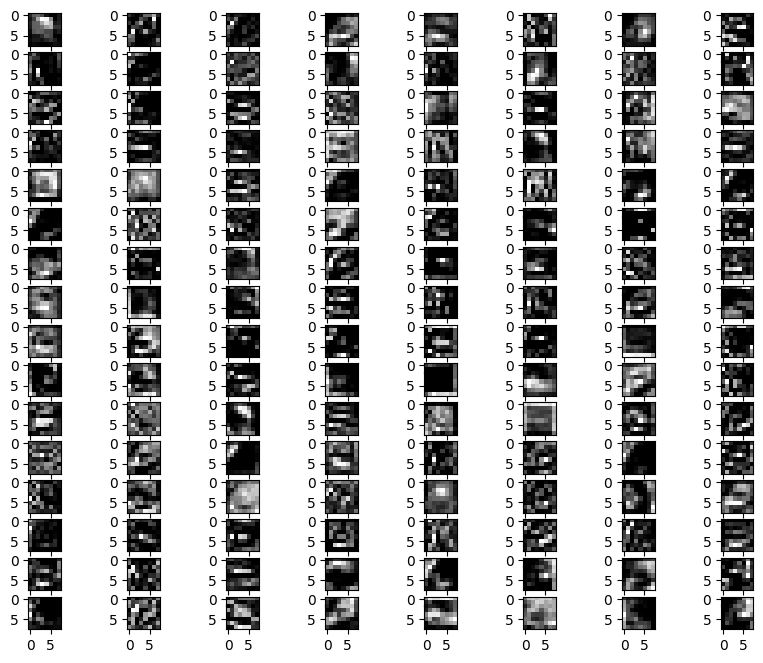

In [ ]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    X_train,
    'block2_pool',
    img_index
)

1/1 [==============================] - 0s 170ms/step
(1, 4, 4, 256)


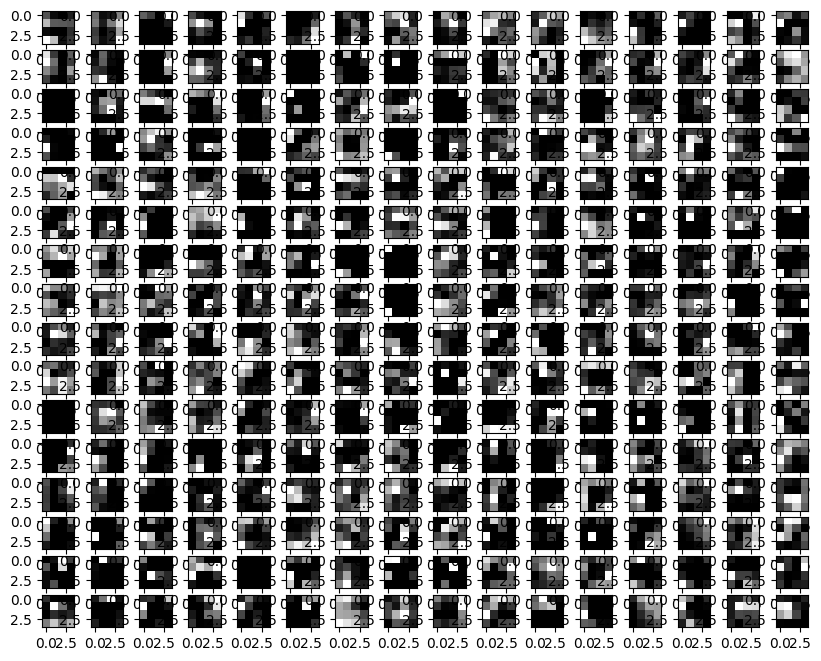

In [ ]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    X_train,
    'block3_pool',
    img_index
)

1/1 [==============================] - 0s 216ms/step
(1, 2, 2, 512)


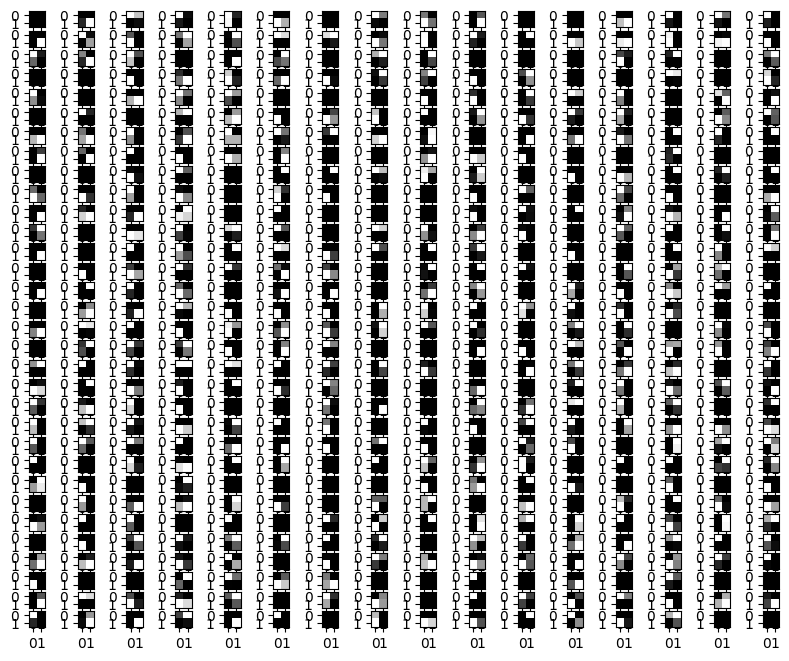

In [ ]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    X_train,
    'block4_pool',
    img_index
)

1/1 [==============================] - 0s 184ms/step
(1, 1, 1, 512)


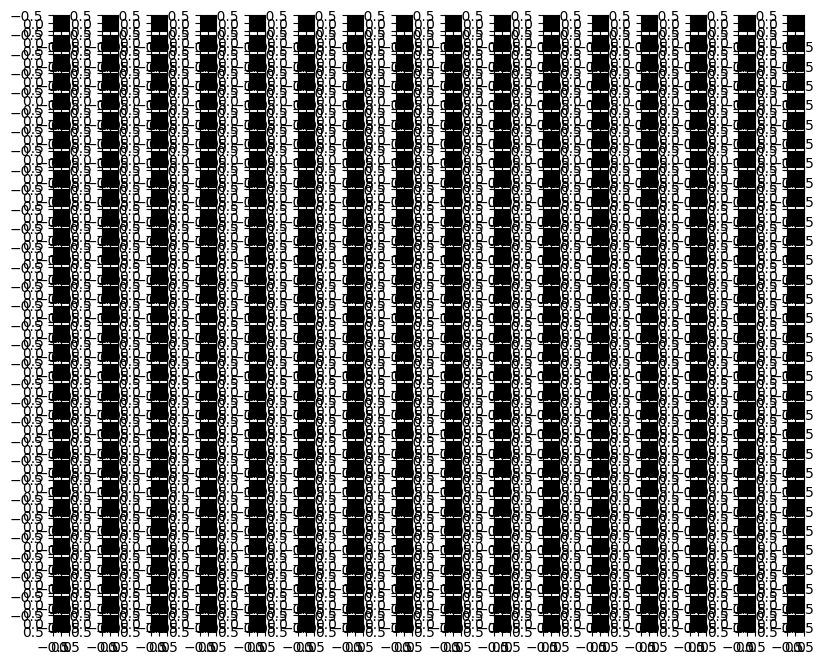

In [ ]:
visualize_conv_layer(
    vgg16_model.get_layer('vgg16'),
    X_train,
    'block5_pool',
    img_index
)

## LIME

Using LIME trying to understand what the model is looking for.

In [ ]:
def decode_predictions(preds, top=5, class_index=None):
    """Decodes the prediction of an ImageNet model.

    Args:
      preds: Numpy array encoding a batch of predictions.
      top: Integer, how many top-guesses to return. Defaults to 5.
      class_index: Optional dictionary mapping class index to class label.
        If not provided, will be loaded from a default file.

    Returns:
      A list of lists of top class prediction tuples
      `(class_name, class_description, score)`.
      One list of tuples per sample in batch input.

    Raises:
      ValueError: In case of invalid shape of the `pred` array
        (must be 2D).
    """
    if len(preds.shape) != 2:
        raise ValueError("`preds` must be a 2D array")
    num_classes = preds.shape[1]
    if class_index is None:
        fpath = data_utils.get_file(
            "imagenet_class_index.json",
            "https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json",
            cache_subdir="models",
            file_hash="c2c37ea517e94d9795004a39431a14cb",
        )
        with open(fpath) as f:
            class_index = json.load(f)
    if len(class_index) != num_classes:
        raise ValueError(
            "number of classes in `class_index` does not match `preds` shape"
        )
    results = []
    for pred in preds:
        top_indices = pred.argsort()[-top:][::-1]
        result = [tuple(class_index[str(i)]) + (pred[i],) for i in top_indices]
        result.sort(key=lambda x: x[1], reverse=True)
        results.append(result)
    return results


In [ ]:
preds = vgg16_model.predict(X_test)


94/94 [==============================] - 1s 8ms/step


In [ ]:
for x in decode_predictions(preds, class_index=classes_dict)[:10]:
    print(x)


[('cup', 0.24245983), ('lamp', 0.18407033), ('can', 0.14044401), ('telephone', 0.101707265), ('chair', 0.08743734)]
[('pear', 0.4135292), ('apple', 0.10223113), ('spider', 0.052036285), ('dinosaur', 0.04323781), ('caterpillar', 0.032966904)]
[('orchid', 0.4785536), ('rose', 0.47132978), ('tulip', 0.046749126), ('poppy', 0.0023816149), ('apple', 0.00076085015)]
[('shrew', 0.27387807), ('bee', 0.18783732), ('mushroom', 0.061900895), ('butterfly', 0.057211388), ('forest', 0.04374798)]
[('chimpanzee', 0.38868332), ('bear', 0.3534103), ('elephant', 0.16113973), ('cattle', 0.05786491), ('porcupine', 0.00758251)]
[('motorcycle', 0.5604251), ('television', 0.07928414), ('wolf', 0.07271901), ('bicycle', 0.0650359), ('tiger', 0.04211217)]
[('tractor', 0.40772715), ('bus', 0.20149879), ('motorcycle', 0.123626314), ('bee', 0.07445696), ('lawn_mower', 0.040745974)]
[('beetle', 0.41744885), ('caterpillar', 0.098152995), ('shrew', 0.073840305), ('squirrel', 0.04823336), ('spider', 0.046473797)]
[('ra

In [ ]:
explainer = lime_image.LimeImageExplainer(random_state=77)


In [ ]:
explanation = explainer.explain_instance(
    X_test[img_index].astype('double'),
    vgg16_model.predict,
    top_labels=5,
    hide_color=0,
    num_samples=1000
)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


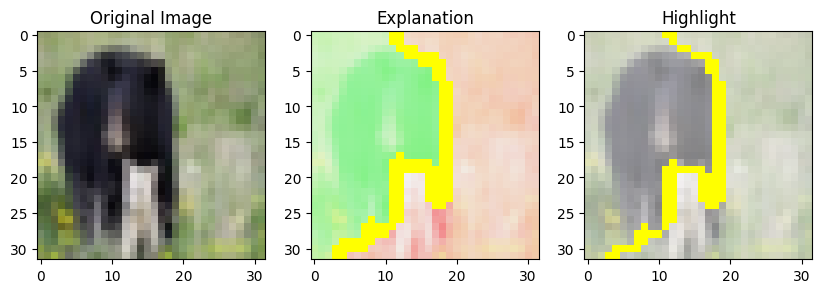

In [ ]:
original_image = X_test[img_index]

temp1, mask1 = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=False,
    num_features=10,
    hide_rest=False
)

temp2, mask2 = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)

fig, ax = plt.subplots(1, 3, figsize=(10, 10))
ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[1].imshow(mark_boundaries(temp1 / 2 + 0.5, mask1))
ax[1].set_title('Explanation')
ax[2].imshow(mark_boundaries(temp2 / 2 + 0.5, mask2))
ax[2].set_title('Highlight')
plt.show()

In [ ]:
print('Right class: ', classes_dict[str(np.argmax(y_test[img_index]))])
print('Predicted class: ', classes_dict[str(np.argmax(preds[img_index]))])

Right class:  ['bear']
Predicted class:  ['chimpanzee']


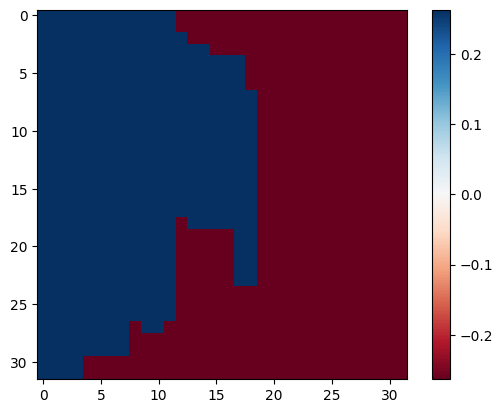

In [ ]:
# Select the same class explained on the figures above.
ind = explanation.top_labels[0]

# Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

# Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap='RdBu', vmin=-heatmap.max(), vmax=heatmap.max())
plt.colorbar()
